In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from matplotlib import cm
# from scipy.constants import h, c, k
from astropy import units as u
from astropy import constants as const

import bexrb_reflection as bexrb

from importlib import reload

import pandas as pd
from scipy.interpolate import CubicSpline
from scipy import integrate

sigma_T=(const.sigma_T).cgs.value
sigma_SB=(const.sigma_sb).cgs.value
sigma_wien = 0.2897755
evtoerg = 1.6e-12
kpc_to_cm = 3.086e21
A_to_cm = (u.angstrom).to(u.cm)

from importlib import reload
c=(const.c).cgs.value
k=(const.k_B).cgs.value
h=(const.h).cgs.value

compute Carciofi


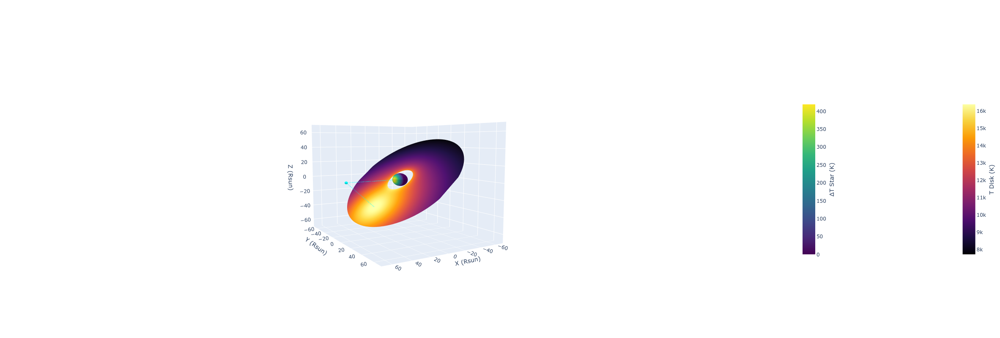

In [2]:
# Parameters
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 108/115 * 3.4477e12  # Distance in cm (115 light-seconds)
point_source_distance = 5E+12
point_source_distance = 64*Rsun
T0_star = 30000  # Initial temperature in Kelvin
# T0_disk = T0_star*0.6  # Initial temperature in Kelvin
T0_disk = T0_star #Carciofi
L = 1E+39  # Luminosity in erg/s
# L = 0
inner_disk_radius = 2.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 9 * star_radius  # Outer radius of the disk
inclination_angle_y = 45.0  # Inclination angle in degrees
inclination_angle_z = 0

# bexrb.plot_star_and_disk_with_temperature_change(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk,n=2)
bexrb.plot_star_and_disk_with_temperature_change(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk,n=0.8,flag=True,Carciofi=True)


compute Carciofi
compute Carciofi


Text(0, 0.5, '$\\lambda{F_{\\lambda}}\\,(erg/cm^2/s)$')

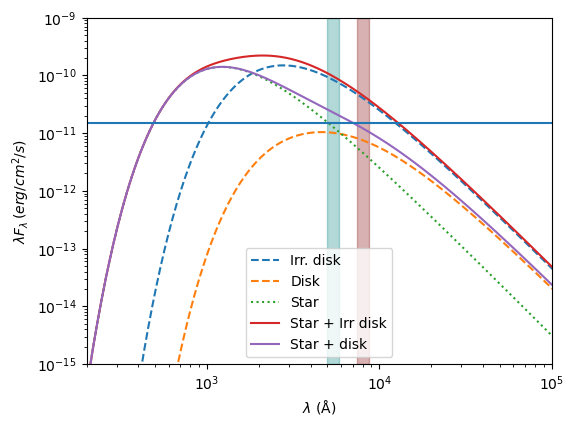

In [4]:
wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.75, en='W',Carciofi=True)
wave = wave*1E+8

fig = plt.figure(figsize=(6, 4.5))
D =50*kpc_to_cm

plt.plot(wave,wave*1E-8*sed_disk/(2*np.pi**2*D**2),'--',label='Irr. disk')
plt.plot(wave,wave*1E-8*sed_disk0/(2*np.pi**2*D**2),'--',label='Disk')
plt.plot(wave,wave*1E-8*sed_Star0/(4*np.pi**2*D**2),':',label='Star')

plt.plot(wave,wave*1E-8*(sed_Star0/(4*np.pi**2 *D**2)+sed_disk/(2*np.pi**2*D**2) ),label='Star + Irr disk')
plt.plot(wave,wave*1E-8*(sed_Star0/(4*np.pi**2 *D**2)+sed_disk0/(2*np.pi**2*D**2) ),label='Star + disk')

plt.axvspan(4.95e-5*1E+8, 5.8e-5*1E+8, alpha=0.3, color='teal')
plt.axvspan(7.4e-5*1E+8, 8.7e-5*1E+8, alpha=0.3, color='maroon')

plt.xscale('log')
plt.yscale('log')
# plt.ylim(1e-10,1e-4)
plt.ylim(1e-15,1e-9)

# plt.ylim(1e-5,1e-1)

plt.axhline(1.5E-11)

plt.legend()

plt.xlim(2e-6*1E+8,1e-3*1E+8)

plt.xlabel(r'$\lambda$ (Å)')
plt.ylabel(r'$\lambda{F_{\lambda}}\,(erg/cm^2/s)$')


# bexrb.sf('SED_filters')

In [5]:
# Parameters
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 6 * Rsun
num_points = 100
point_source_distance = 1.4* 108/115 * 3.4477e12  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = 30000  # Initial temperature in Kelvin
L = 3E+38  # Luminosity in erg/s
inner_disk_radius = 2 * star_radius  # Inner radius of the disk
outer_disk_radius = 5 * star_radius  # Outer radius of the disk
inclination_angle_y = 45.0  # Inclination angle in degrees
inclination_angle_z = 0

wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W',Carciofi=True)

print('star:',bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)))
print('star+disk0:',bexrb.col_mag(wave,sed_Star0*np.pi/(4*np.pi *D**2)+sed_disk0*np.pi/(2*np.pi*D**2) ))
print('star+disk:',bexrb.col_mag(wave,sed_Star0*np.pi/(4*np.pi *D**2)+sed_disk*np.pi/(2*np.pi*D**2) ))

compute Carciofi
compute Carciofi
star: (14.946422498835865, 15.147090999134956, -0.15366850029909135)
star+disk0: (13.187092884033241, 13.127505971905112, 0.10658691212812894)
star+disk: (12.806271301468435, 12.75720262784331, 0.09606867362512557)


In [6]:
par1 = np.linspace(inner_disk_radius*1.1,outer_disk_radius,10)
par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

In [7]:
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 2* 115/115 * 3.4477e12  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = 30000  # Initial temperature in Kelvin
L = 2E+39  # Luminosity in erg/s
inner_disk_radius = 1.1 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


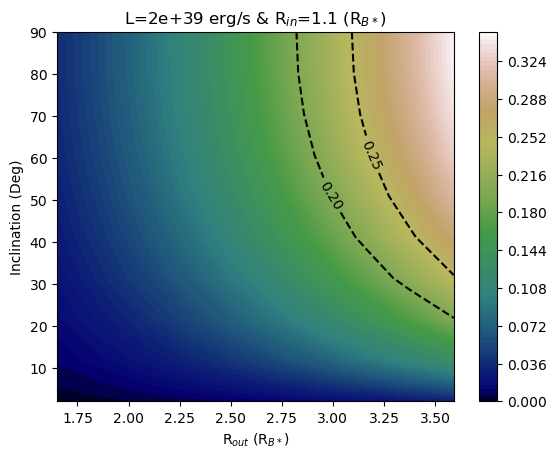

In [8]:
# plt.imshow(parV)
cmap=cm.gist_earth
h = plt.contourf(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0),cmap=cmap,levels=100)

CS = plt.contour(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0), [0.2,0.25,0.36],colors=['k','k','k'],linestyles='dashed')
plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{B*}$)')
plt.ylabel(r'Inclination (Deg)')
plt.title(r'L={0} erg/s & R$_{{in}}$={1} (R$_{{B*}}$)'.format(L, inner_disk_radius/star_radius))
plt.colorbar(h)
plt.show()

In [9]:
inner_disk_radius = 2 * star_radius

par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0
            
            

compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


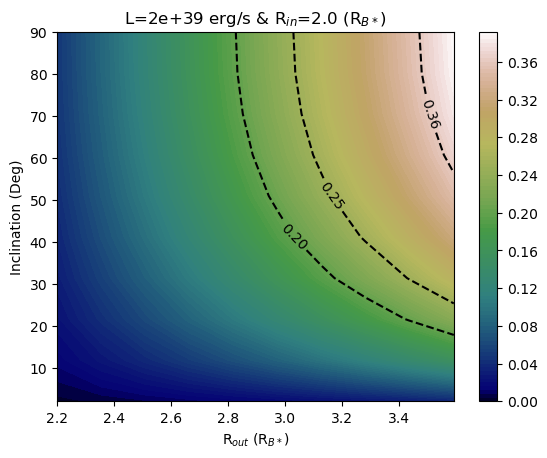

In [10]:
h = plt.contourf(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0),cmap=cmap,levels=100)

CS = plt.contour(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0), [0.2,0.25,0.36],colors=['k','k','k'],linestyles='dashed')
plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{B*}$)')
plt.ylabel(r'Inclination (Deg)')
plt.title(r'L={0} erg/s & R$_{{in}}$={1} (R$_{{B*}}$)'.format(L, inner_disk_radius/star_radius))
plt.colorbar(h)
plt.show()

## LXP 8.04

In [11]:
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 105 *c  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = T0_star*0.75  # Initial temperature in Kelvin
L = 0.4E+39  # Luminosity in erg/s
inner_disk_radius = 1.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,0.8*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.8, en='W',Carciofi=True)
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


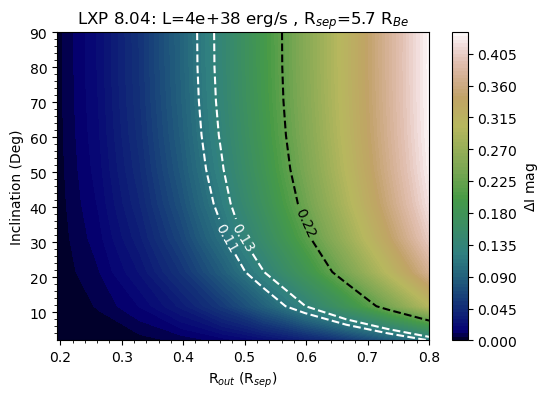

In [12]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth

h = plt.contourf(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)),cmap=cmap,levels=100)
CS = plt.contour(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)), [0.11,0.13,0.22],colors=['white','white','k'],linestyles='dashed')

plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')
# plt.title(r'LXP 8.04: L={0} erg/s & R$_{{in}}$={1} (R$_{{Be}}$)'.format(L, inner_disk_radius/star_radius))
plt.title(r'LXP 8.04: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))

colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$I mag')

bexrb.sf('LXP_8.04_contour_Car')
# plt.show()

## SMC X-2 

In [13]:
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 73.7 *c  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = T0_star*0.6  # Initial temperature in Kelvin
L = 0.7E+39  # Luminosity in erg/s
inner_disk_radius = 1.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,0.8*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.75, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


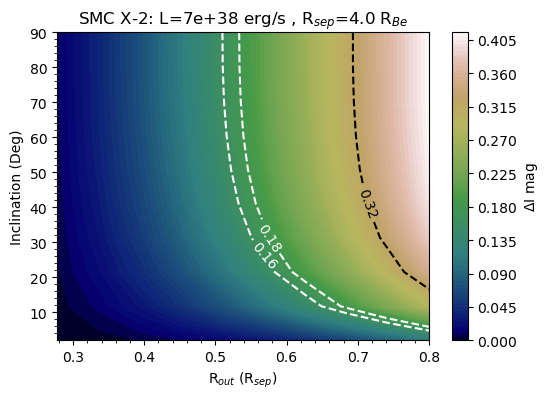

In [14]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth
# h = plt.contourf(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0),cmap=cmap,levels=100)
# CS = plt.contour(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0), [0.25,0.32,0.5],colors=['k','k','k'],linestyles='dashed')

h = plt.contourf(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)),cmap=cmap,levels=100)
CS = plt.contour(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)), [0.16,0.18,0.32],colors=['white','white','k'],linestyles='dashed')

plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')
# plt.title(r'SMC X-3: L={0} erg/s & R$_{{in}}$={1} (R$_{{B*}}$)'.format(L, inner_disk_radius/star_radius))
# plt.title(r'SMC X-2: L={0} erg/s & R$_{{in}}$={1} (R$_{{Be}}$)'.format(L, inner_disk_radius/star_radius))
plt.title(r'SMC X-2: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))

colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$I mag')

bexrb.sf('SMC_X2_contour_Car')

## SMC X3

In [15]:
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 189 *c  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = T0_star*0.6  # Initial temperature in Kelvin
L = 2.5E+39  # Luminosity in erg/s
inner_disk_radius = 1.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,0.6*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.75, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


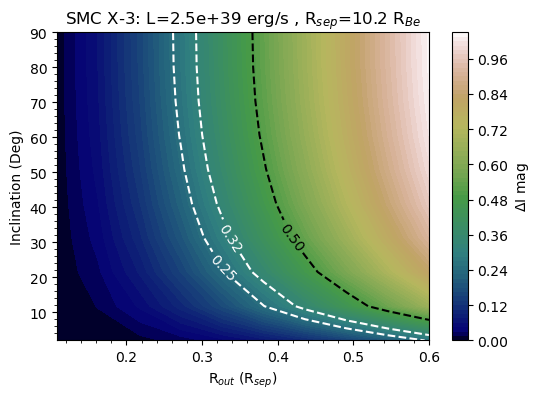

In [16]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth
# h = plt.contourf(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0),cmap=cmap,levels=100)
# CS = plt.contour(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0), [0.25,0.32,0.5],colors=['k','k','k'],linestyles='dashed')

h = plt.contourf(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)),cmap=cmap,levels=100)
CS = plt.contour(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)), [0.25,0.32,0.5],colors=['white','white','k'],linestyles='dashed')

plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')
# plt.title(r'SMC X-3: L={0} erg/s & R$_{{in}}$={1} (R$_{{B*}}$)'.format(L, inner_disk_radius/star_radius))
# plt.title(r'SMC X-3: L={0} erg/s & R$_{{in}}$={1} (R$_{{Be}}$)'.format(L, inner_disk_radius/star_radius))
plt.title(r'SMC X-3: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))
colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$I mag')

bexrb.sf('SMC_X3_contour_Car')
# plt.show()

## SXP 4.78

In [17]:

Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 100 *c  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = T0_star*0.6  # Initial temperature in Kelvin
L = 0.18E+39  # Luminosity in erg/s
inner_disk_radius = 1.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,0.8*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.75, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


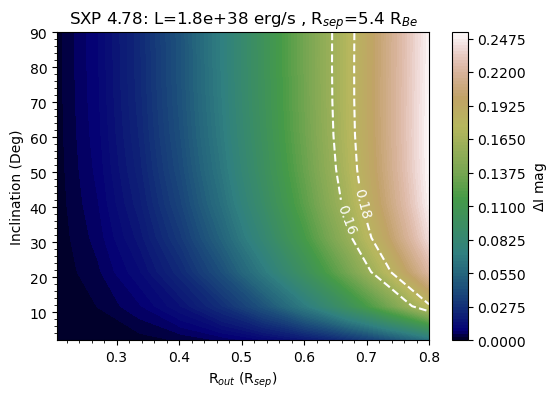

In [18]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth
# h = plt.contourf(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0),cmap=cmap,levels=100)
# CS = plt.contour(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0), [0.25,0.32,0.5],colors=['k','k','k'],linestyles='dashed')

h = plt.contourf(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)),cmap=cmap,levels=100)
CS = plt.contour(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)), [0.16,0.18,0.32],colors=['white','white','k'],linestyles='dashed')

plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')
# plt.title(r'SMC X-3: L={0} erg/s & R$_{{in}}$={1} (R$_{{B*}}$)'.format(L, inner_disk_radius/star_radius))
# plt.title(r'SXP 4.78: L={0} erg/s & R$_{{in}}$={1} (R$_{{Be}}$)'.format(L, inner_disk_radius/star_radius))
plt.title(r'SXP 4.78: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))
colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$I mag')

bexrb.sf('SXP_4.78_contour_Car')

## SXP 5.05

In [19]:
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 142.4 *c  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = T0_star+0.6  # Initial temperature in Kelvin
L = 0.13E+39  # Luminosity in erg/s
inner_disk_radius = 1.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,0.8*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.75, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


In [20]:
Rsun = 6.96E+10  # Solar radius in cm
# star_radius = 8 * Rsun
star_radius = 5.2E+11
num_points = 100
# point_source_distance = 142.4 *c  # Distance in cm (115 light-seconds)
point_source_distance = 4.08E+12
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = T0_star*0.6  # Initial temperature in Kelvin
L = 0.13E+39  # Luminosity in erg/s
inner_disk_radius = 3.01 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,1.0*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=0.75, en='W',Carciofi=True)
            # wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_star*0.8, albedo=0.75, n=1.0, en='W',Carciofi=False)
            
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


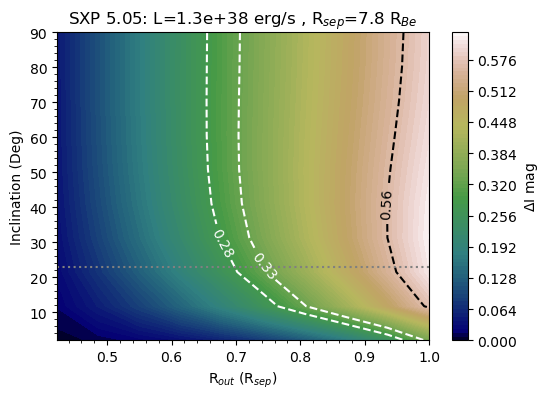

In [21]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth

h = plt.contourf(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)),cmap=cmap,levels=100)
CS = plt.contour(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)), [0.28,0.33,0.56],colors=['white','white','k'],linestyles='dashed')

plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')
plt.title(r'SXP 5.05: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))
colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$I mag')


plt.axhline(23,ls=':',color='grey')
bexrb.sf('SXP_5.05_contour_Car_Rin3_a0d5')
# bexrb.sf('SXP_5.05_contour_n09_t08')
# bexrb.sf('SXP_5.05_contour_n1d1_t0d8')
# bexrb.sf('SXP_5.05_contour_n1d0_t0d8_rin1d5_a0d75')

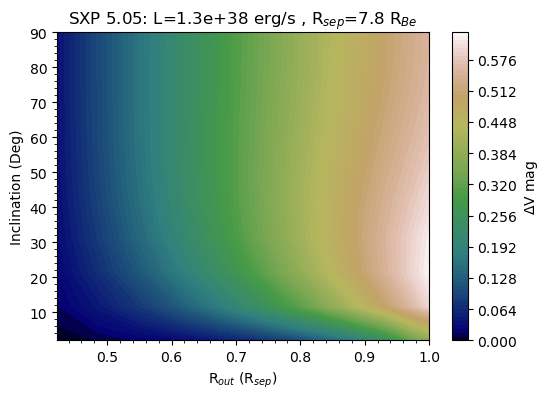

In [22]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth

I = (-np.transpose(parI)+np.transpose(parI0))
V = (-np.transpose(parV)+np.transpose(parV0))

VI = V-I

h = plt.contourf(parT1/point_source_distance, parT2, V,cmap=cmap,levels=100)

plt.clabel(CS, inline=True, fontsize=10)
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')

plt.title(r'SXP 5.05: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))
colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$V mag')
# colorbar.set_label(r'V-I')

## J0243

In [23]:
Rsun = 6.96E+10  # Solar radius in cm
star_radius = 8 * Rsun
num_points = 100
point_source_distance = 2*115 *c  # Distance in cm (115 light-seconds)
T0_star = 30000  # Initial temperature in Kelvin
T0_disk = 30000*0.75  # Initial temperature in Kelvin
L = 2E+39  # Luminosity in erg/s
inner_disk_radius = 1.001 * star_radius  # Inner radius of the disk
outer_disk_radius = 8 * star_radius  # Outer radius of the disk
inclination_angle_y = 15.0  # Inclination angle in degrees
inclination_angle_z = 0


par1 = np.linspace(inner_disk_radius*1.1,0.5*point_source_distance,10)
# par1 = np.linspace(inner_disk_radius*1.1,2E+12,10)
par2 = np.linspace(2,90,10)
parT1, parT2 = np.meshgrid(par1, par2)

parV = parT1*0
parI = parT2*0
parV0 = parT1*0
parI0 = parT2*0

    
for i in range(parT1.shape[0]):
        for j in range(parT1.shape[1]):
            outer_disk_radius = par1[i]
            inclination_angle_y = par2[j]
            wave, sed_Star0, sed_disk0, sed_disk = bexrb.sed_build(star_radius, num_points, point_source_distance, T0_star, L, inner_disk_radius, outer_disk_radius, inclination_angle_y, inclination_angle_z, T0_disk, albedo=0.5, n=2, en='W')
            mag_V_sys0, mag_I_sys0, color_VI_sys0 = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk0/(2*np.pi*D**2) )
            mag_V_sys, mag_I_sys, color_VI_sys = bexrb.col_mag(wave,sed_Star0/(4*np.pi *D**2)+sed_disk/(2*np.pi*D**2) )
            parV[i,j] = mag_V_sys
            parI[i,j] = mag_I_sys
            parV0[i,j] = mag_V_sys0
            parI0[i,j] = mag_I_sys0

compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi
compute Carciofi


/home/gevas/Dropbox/BeXRBs_Reflection/BeXRIOT/bexrb_reflection.py:356: RuntimeWarning:

overflow encountered in exp



compute Carciofi


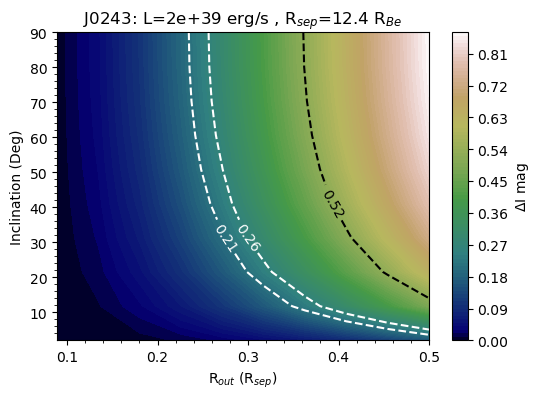

In [24]:
fig = plt.figure(figsize=(6, 4))
plt.minorticks_on()
cmap=cm.gist_earth
# h = plt.contourf(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0),cmap=cmap,levels=100)
# CS = plt.contour(parT1/star_radius, parT2, -np.transpose(parI)+np.transpose(parI0), [0.25,0.32,0.5],colors=['k','k','k'],linestyles='dashed')

h = plt.contourf(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)),cmap=cmap,levels=100)
CS = plt.contour(parT1/point_source_distance, parT2, (-np.transpose(parI)+np.transpose(parI0)), [0.21,0.26,0.52],colors=['white','white','k'],linestyles='dashed')

plt.clabel(CS, inline=True, fontsize=10)
# plt.axis('scaled')
plt.xlabel(r'R$_{out}$ (R$_{sep}$)')
plt.ylabel(r'Inclination (Deg)')
# plt.title(r'SMC X-3: L={0} erg/s & R$_{{in}}$={1} (R$_{{B*}}$)'.format(L, inner_disk_radius/star_radius))
# plt.title(r'J0243: L={0} erg/s & R$_{{in}}$={1} (R$_{{Be}}$)'.format(L, inner_disk_radius/star_radius))
plt.title(r'J0243: L={0} erg/s , R$_{{sep}}$={1:.1f} R$_{{Be}}$'.format(L, point_source_distance/star_radius))

# L_scientific = "{:.2e}".format(L)
# formatted_distance = point_source_distance / star_radius
# L_scientific = L_scientific.replace('e+', r' $\times 10^{').replace('e-', r' \times 10^{-$').replace('e', '}')
# plt.title(r'J0243: L={0} erg/s & R$_{{sep}}$={1:.2f} (R$_{{Be}}$)'.format(L_scientific, formatted_distance))

colorbar = plt.colorbar(h)
colorbar.set_label(r'$\Delta$I mag')

bexrb.sf('J0243_contour_Car')